In [81]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [91]:
path = r'/Volumes/Tianxiao/Spinning_Disk/Buffer_treated/'
root = r'intensity_variations.csv'
frames = 500
df_all_events = pd.read_csv(path+root)

In [83]:
threshold =20
binary = df_all_events > threshold


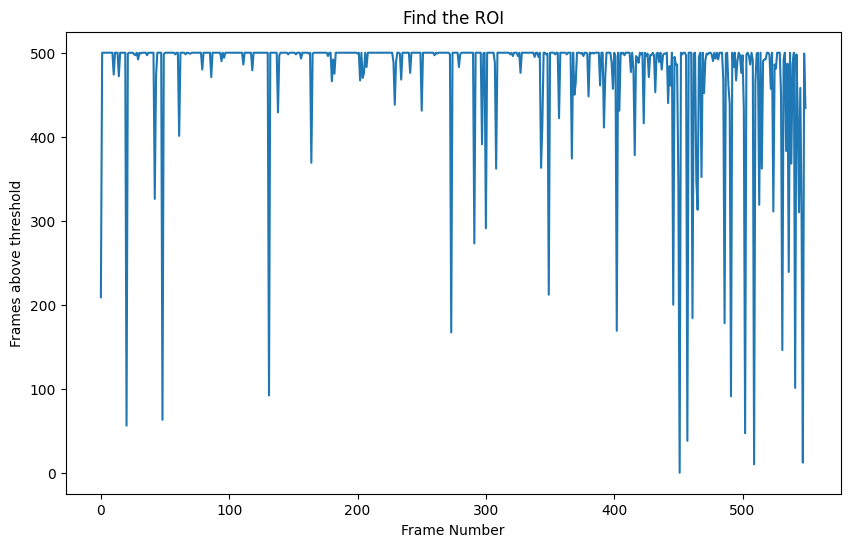

In [84]:
# Screen will tell you how may frames are above the threshold
screen = binary.sum(axis = 1)
plt.figure(figsize = (10,6))
plt.xlabel('Frame Number')
plt.ylabel('Frames above threshold')
plt.title('Find the ROI')
plt.plot(screen)
plt.savefig(path+'screen.pdf')


In [85]:
# This loop will find out which pinhole has at least one frame abouve the threshold.
region_of_interest = []
count = 0
for row in screen:
    if row > 0:
        region_of_interest.append(count)
        count += 1
    else:
        count += 1


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

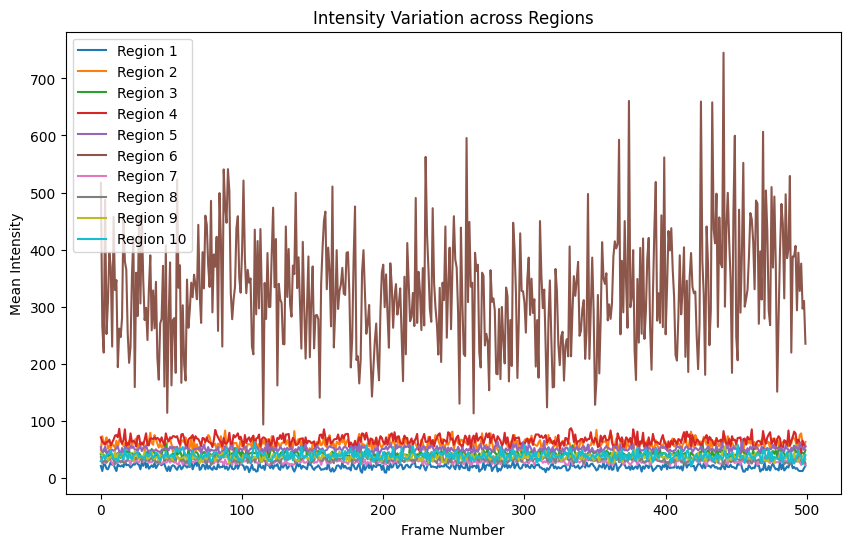

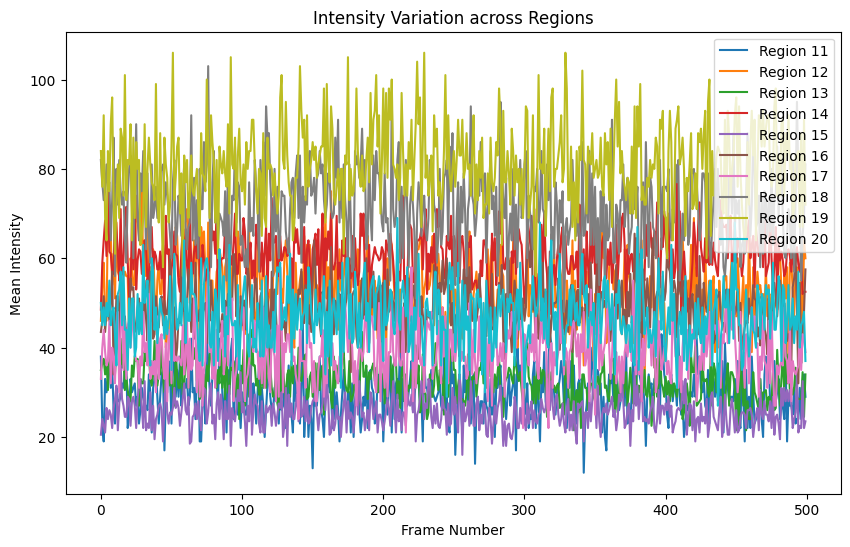

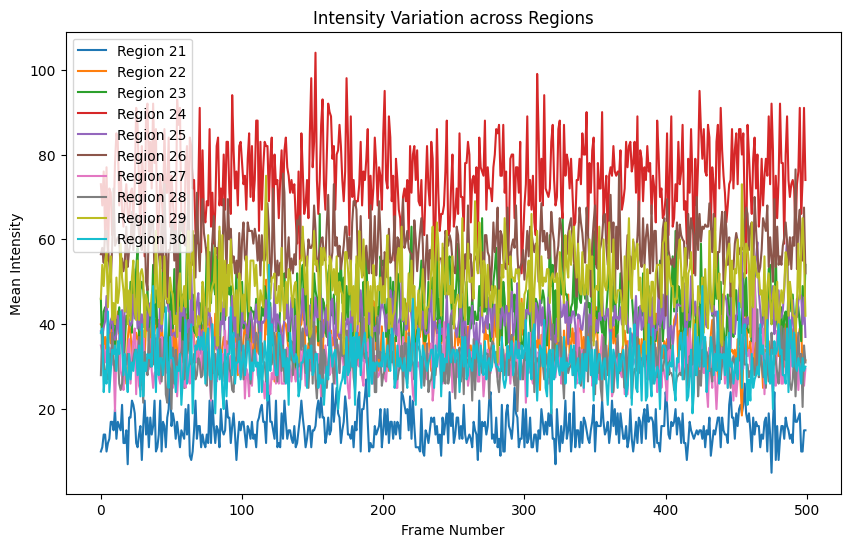

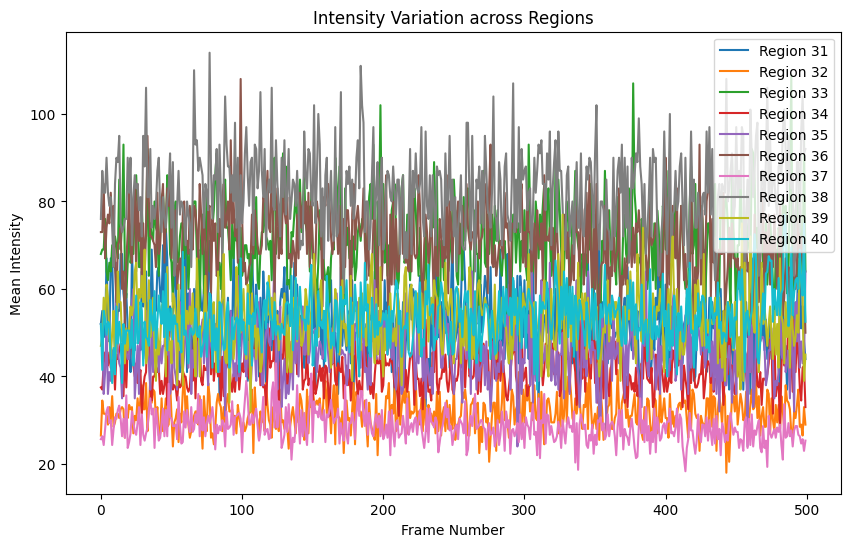

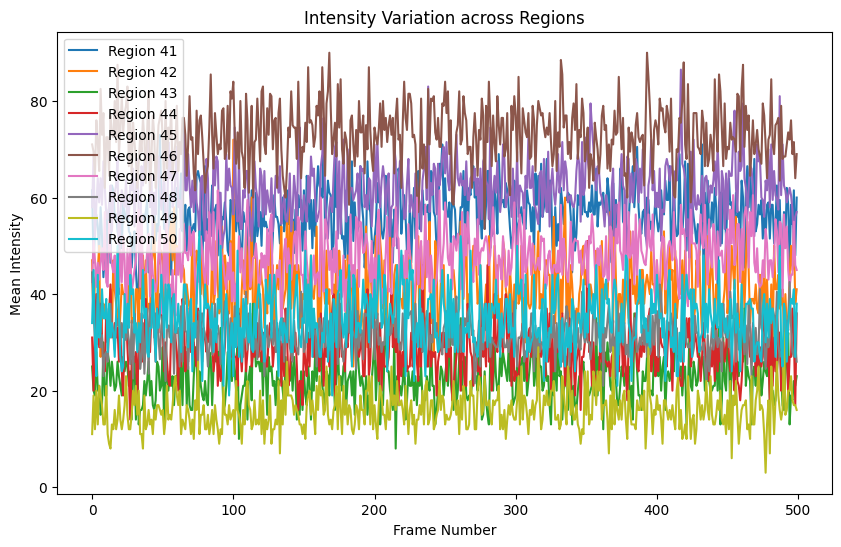

...

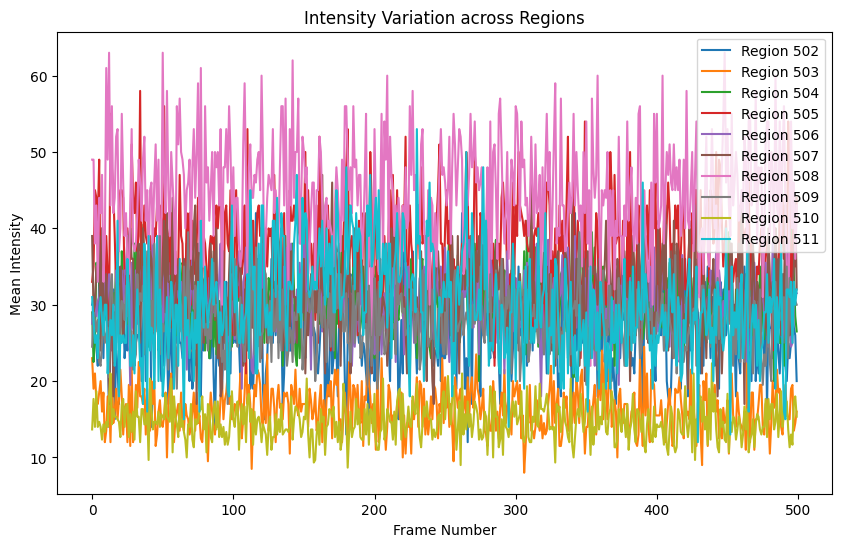

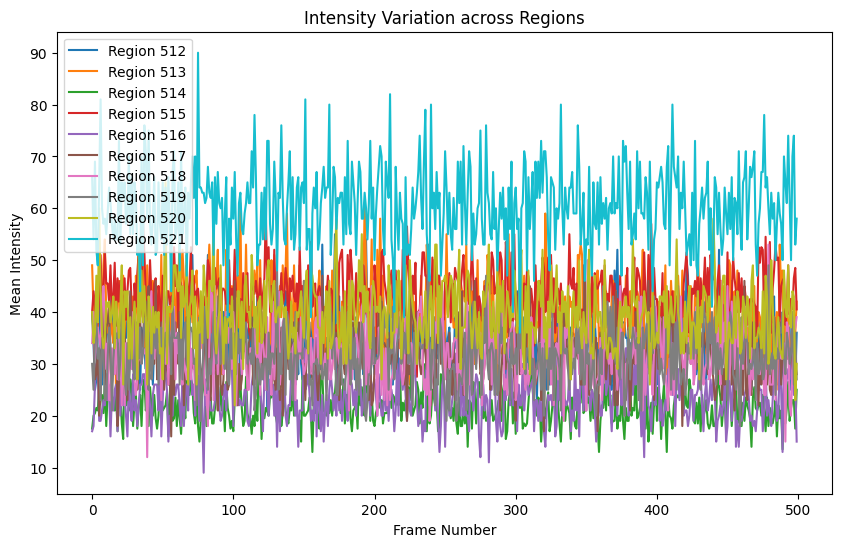

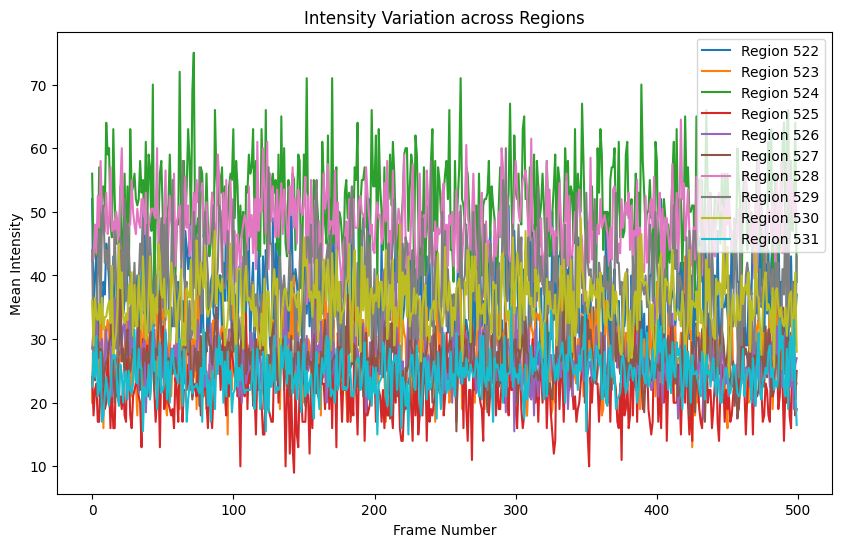

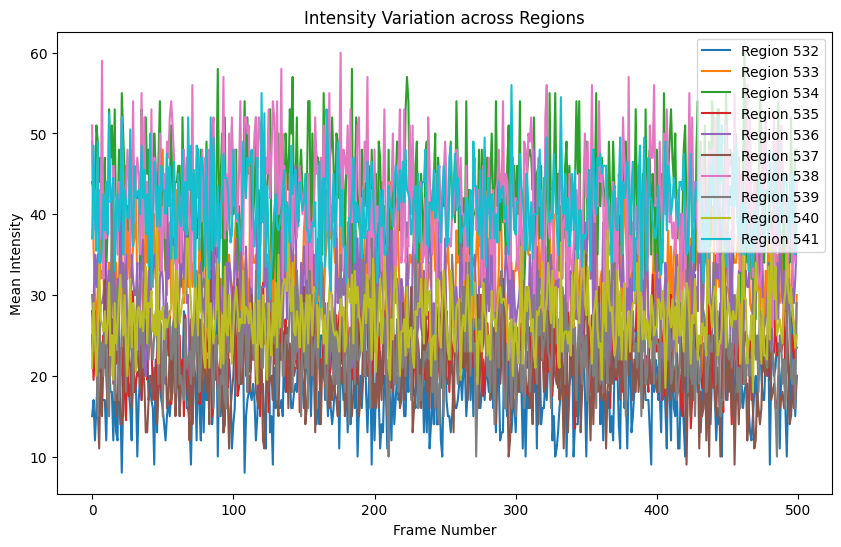

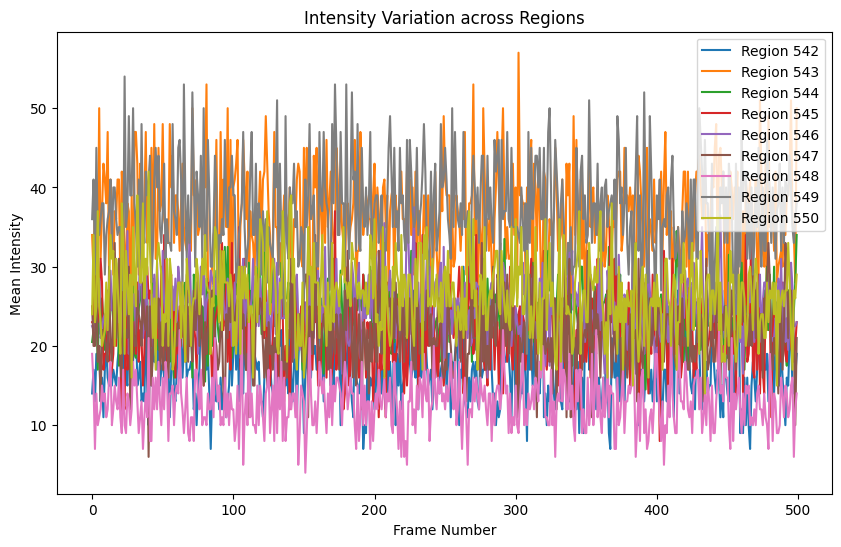

In [98]:
x_axis = np.arange(0,frames)
size = len(region_of_interest)
if size == 0:
    print('No ROI found')
if size <11: 
    plt.figure(figsize=(10, 6))
    for i in region_of_interest: 
        plt.plot(x_axis, df_all_events.iloc[i],label=f'Region {i+1}')
    plt.xlabel('Frame Number')
    # plt.xticks(ticks=x_axis, step=100)
    plt.ylabel('Mean Intensity')
    plt.title('Intensity Variation across Regions')
    plt.legend()
    plt.savefig(path+'ROI_intensity_variation.pdf')
    plt.show()
else:
    for i in range(0, size, 10):
        plt.figure(figsize=(10, 6))
        for j in range(i, min(i+10, size)):
            plt.plot(x_axis, df_all_events.iloc[region_of_interest[j]], label=f'Region {region_of_interest[j]+1}')
        plt.xlabel('Frame Number')
        # plt.xticks(x_axis, step=100)
        plt.ylabel('Mean Intensity')
        plt.title('Intensity Variation across Regions')
        plt.legend()
        plt.savefig(path+f'ROI_intensity_variation_{i}.pdf')
        plt.show()